<div style="padding:0px 40px 20px; 
            color:#201E20;
            font-size:20px;
            display:fill;
            text-align:center;
            border-radius:20px;
            border: 5px double;
            border-color:#201E20;
            background-color: #ED8D8D;
            overflow:hidden;
            font-weight:400"> 

# Рынок заведений общественного питания Москвы

</div>



<div style="padding:0px 40px 30px; 
            color:#201E20;
            font-size:110%;
            display:fill;
            border-radius:20px;
            border: 5px double;
            border-color:#201E20;
            background-color: #F5EBEB;
            overflow:hidden;
            font-weight:450;"> 
<br>
<h1 style = "text-align:center;font-size:20px;">Оглавление:</h1>  

    
1. Предобработка данных

    
2. Анализ данных

    
3. Детализируем исследование: открытие кофейни


4. Презентация

    
5. Общий вывод по проекту
 
<h1 style = "text-align:center;font-size:20px;">Описание проекта:</h1>  

    

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


В нашем распоряжении данные о визитах, заказах и рекламных расходах 

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;

- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.



</div>

## Предобработка данных





In [1]:
# Импортируем все необходимые библиотеки:
import pandas as pd
import matplotlib.pyplot as plt
from plotly import graph_objects as go 
plt.style.use('ggplot')
plt.rcParams ['figure.figsize'] = [12, 8]
import numpy as np
import seaborn as sns
from datetime import datetime, timedelta
from scipy import stats as st
import math as mth
import warnings
warnings.filterwarnings('ignore')

https://drive.google.com/file/d/1gR8wnySKkv02hyvdc10po7UrGrIapyWJ/view?usp=sharing

In [2]:
! gdown 1gR8wnySKkv02hyvdc10po7UrGrIapyWJ # подгружаем файл с gdrive

/bin/bash: gdown: command not found


In [3]:
# Сделаем универсальную загрузку чтобы работать через Colab и JupiterNotebook:

try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv('/content/moscow_places.csv')
    
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
# Оценим наличие полных дубликатов 
print(f'Количество полных дубликатов:{df.duplicated().sum()}')

Количество полных дубликатов:0


In [6]:
# Оценим наличие пропусков 
print(f'Количество пропусков:{df.isna().sum()}')

Количество пропусков:name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


Пропуски присутствуют, оценим долю пропусков, и на основании этого примем решение о удалении, замене либо игнорировании пропусков:

In [7]:
pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


В данной ситуации в пяти столбцах пропусков слишком много, принимаем решение не удалять пропуски иначе от нашего датафрейма совсем ничего не останется..

In [8]:
print(f'Количество уникальных названий заведений:{df.name.nunique()}') 
print()
print(f'Количество уникальных адресов заведений:{df.address.nunique()}')

Количество уникальных названий заведений:5614

Количество уникальных адресов заведений:5753


In [9]:
from collections import Counter
print(Counter(df['name'])) #посмотрим более детально..

Counter({'Кафе': 189, 'Шоколадница': 120, "Домино'с Пицца": 76, 'Додо Пицца': 74, 'One Price Coffee': 71, 'Яндекс Лавка': 69, 'Cofix': 65, 'Prime': 50, 'Хинкальная': 44, 'Шаурма': 43, 'КОФЕПОРТ': 42, 'Кулинарная лавка братьев Караваевых': 39, 'Теремок': 38, 'Чайхана': 37, 'Ресторан': 34, 'Буханка': 32, 'CofeFest': 32, 'Столовая': 28, 'Му-Му': 27, 'Drive Café': 24, 'Кофемания': 23, 'АндерСон': 22, 'Крошка Картошка': 20, 'Скалка': 20, 'French Bakery': 20, 'Cinnabon': 20, 'Тануки': 19, 'Штолле': 19, 'Арамье': 18, 'VASILCHUKÍ Chaihona №1': 17, 'Хлеб Насущный': 17, 'СушиСтор': 16, 'Osteria Mario': 16, 'Кафетерий': 15, 'Моремания': 15, 'МСК Lounge': 14, 'Pizza Express 24': 14, 'Бургер Кинг': 14, 'Вареничная № 1': 14, 'Алло! Пицца': 13, 'Wild Bean Cafe': 13, 'Brasserie Lambic': 13, 'Pizza Hut': 12, 'Джонджоли': 12, 'Правда кофе': 12, 'Бистро': 12, 'Кофейня': 12, 'Халяль': 10, 'Донер Кебаб': 10, 'Кафе-бар': 10, 'Самарканд': 9, 'Кафе-столовая': 9, 'Bổ': 9, 'Krispy Kreme': 9, 'Волконский': 9, 'P

Создаем столбец street с названиями улиц из столбца с адресом:

In [10]:
df['street'] = df['address'].str.split(',').str[1].str.strip()
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [11]:
df['is_24/7'] = df['hours'].fillna('').str.contains('ежедневно, круглосуточно')
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


По итогам предобработки датасета можно сказать что у нас около 8400 заведений, столбцы хранят значения float64(6), int64(1), object(7),  полных дубликатов нет, но определенно присутствуют неявные дубликаты, которые нужно обрабатывать вручную, что довольно трудоемко. 
Много пропусков в столбцах:
- price	60.6%
- avg_bill	54.6%
- middle_avg_bill	62.5%
- middle_coffee_cup	93.6%
- seats	43%

Убирать пропуски не будем, т.к можно потерять слишком много данных.


## Анализ данных

Посмотрим какие категории заведений представлены в данных, так же исследуем распределении заведений по категориям:

In [12]:
df['category'].unique() # посмотрим заведения каких категорий представлены в датасете

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [13]:

data_by_category = (
    df
    .groupby('category')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)

Так же посчитаем процент от общего числа заведений:

In [14]:
data_by_category['percent'] = data_by_category['count'] / sum(data_by_category['count']) * 100
data_by_category

,category,count,percent
3,кафе,2378,28.289317
6,ресторан,2043,24.304069
4,кофейня,1413,16.809422
0,"бар,паб",765,9.100642
5,пиццерия,633,7.530335
2,быстрое питание,603,7.173448
7,столовая,315,3.747323
1,булочная,256,3.045444


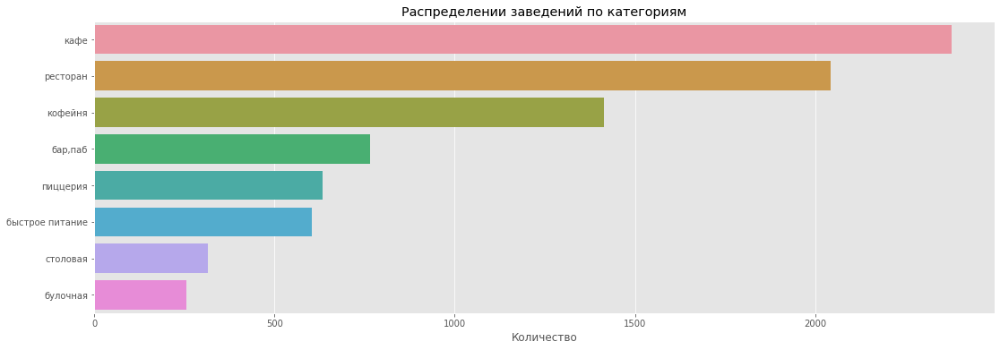

In [15]:
data_by_category
plt.figure(figsize=(18, 6))
ax = sns.barplot(x='count', y='category', 
                 data=data_by_category) 
                 
ax.set_title('Распределении заведений по категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('')
plt.show()


Видим что в общем количестве заведений больше всего кафе - 2378 шт(28%), ресторан	2043 шт(24%), меньше всего булочных, всего 256 шт(3%)

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее и построим визуализации.

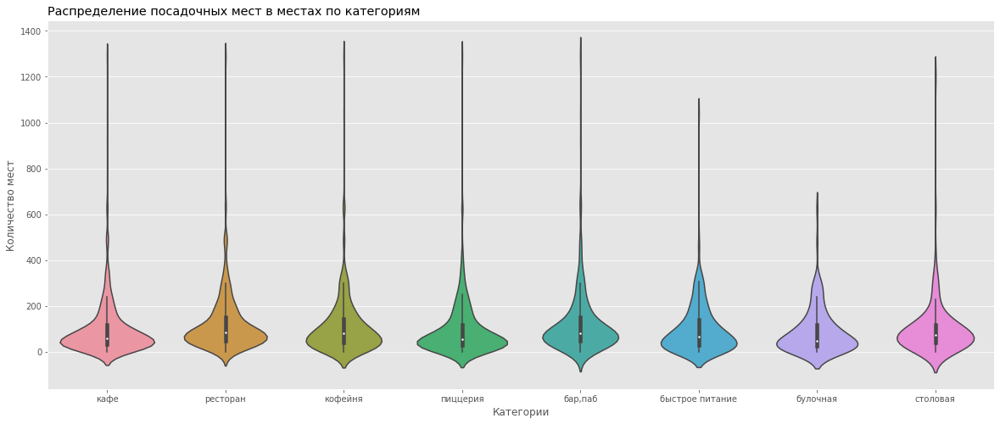

In [16]:

plt.figure(figsize=(20, 8))
ax = sns.violinplot(x=df["category"], y=df["seats"]);
ax.set_xlabel('Категории')
ax.set_ylabel('Количество мест')
ax.set_title('Распределение посадочных мест в местах по категориям', loc='left')
plt.show()

Данная визуализация больше всего подходит для оценки распределения посадочных мест по категориям, видно что во всех категориях есть выбросы, точки с аномально большим количеством посадочных мест, наиболее большие заведения вмещают в себя 1300-1350 посадочных мест, есть и менее вместительные заведения( например самая большая булочная всего на 700 мест). Приблизим нижнюю часть графика:

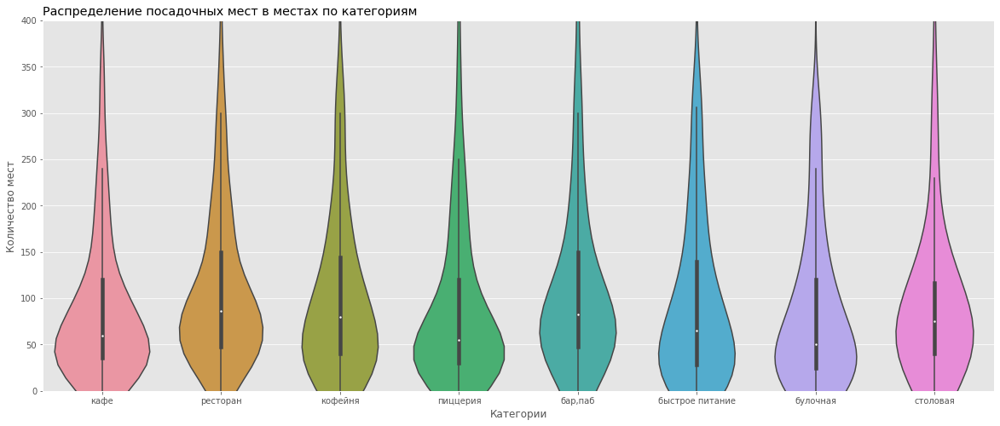

In [17]:
plt.figure(figsize=(20, 8))
ax = sns.violinplot(x=df["category"], y=df["seats"]);
ax.set_ylim([0, 400])
ax.set_xlabel('Категории')
ax.set_ylabel('Количество мест')
ax.set_title('Распределение посадочных мест в местах по категориям', loc='left')
plt.show()

Можно сделать вывод, что в основном самый популярный формат - это заведения с "вилкой" от 40 до 80 посадочных мест, и данное значение немного варируется в зависимости от категории, так же есть заведение совсем без посадочных мест, и далеко идущий 'хвост' из единичных всевозможных заведений с большим количеством мест.

Рассмотрим соотношение сетевых и несетевых заведений в датасете:

In [18]:
df_chain = df.groupby('chain').agg(count=('name','count')).reset_index()
display(df_chain)
print()
plt.figure(figsize=(5, 5))
names = ['не сетевые', 'сетевые']
size = df_chain['count']
fig = go.Figure(data=[go.Pie(labels=names, values=size)])
fig.show() 

,chain,count
0,0,5201
1,1,3205


<Figure size 360x360 with 0 Axes>

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
chain,,,,,,,,
0,596,99,371,1599,693,303,1313,227
1,169,157,232,779,720,330,730,88


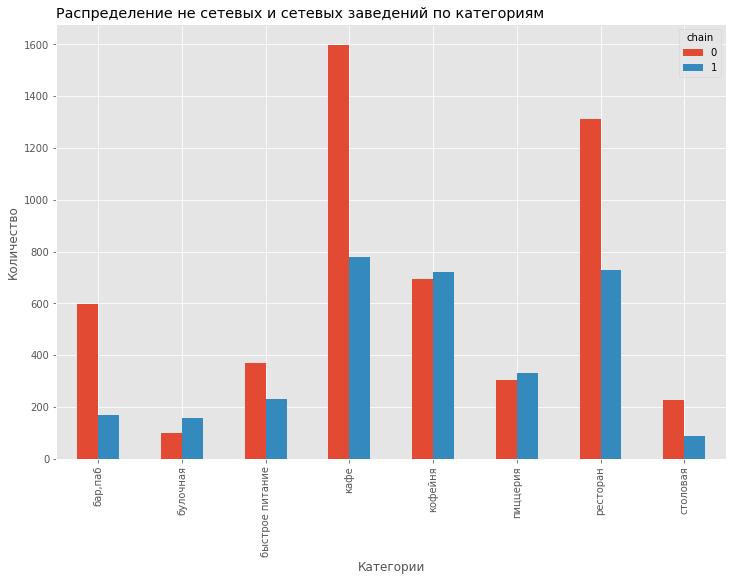

In [19]:
display(pd.crosstab(df["chain"], df["category"]))
print()
ax = pd.crosstab(df["category"], df["chain"]).plot(kind="bar")
ax.set_ylabel('Количество')
ax.set_xlabel('Категории')
ax.set_title('Распределение не сетевых и сетевых заведений по категориям', loc='left')
plt.show()

По итогу видим что не сетевых заведений больше, при этом чаще всего сетевыми становятся булочные, пиццерии и кофейни

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Построим подходящую для такой информации визуализацию.

,name,category,count
3087,Кафе,кафе,159
5943,Шоколадница,кофейня,119
2750,Домино'с Пицца,пиццерия,76
2714,Додо Пицца,пиццерия,74
1214,One Price Coffee,кофейня,71
6019,Яндекс Лавка,ресторан,69
433,Cofix,кофейня,65
1362,Prime,ресторан,49
3011,КОФЕПОРТ,кофейня,42
3529,Кулинарная лавка братьев Караваевых,кафе,39


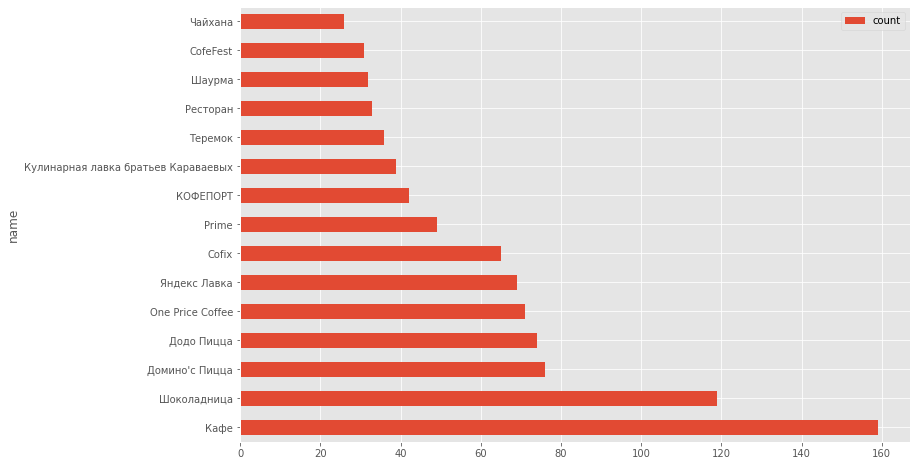

In [20]:
data_name = (
    df
    .groupby(['name','category'])
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)
display(data_name.head(15))
print()
data_name.head(15).plot(kind = 'barh', x='name' ,y='count');


В Топ 15 по популярности наименований входят как общие названия, такие как Кафе, Ресторан, Шаурма, так и реальные названия известных сетей: Шоколадница, ДодоПицца, Домино'с пицца и другие.. В основном это сети кофеен, пиццерий и ресторанов

Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [21]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [22]:
t = (
df.apply(lambda x: x.replace({'Центральный административный округ':'ЦАО', 'Северный административный округ': 'САО', 
                              'Северо-Восточный административный округ': 'СВАО','Северо-Западный административный округ': 'СЗАО', 
                              'Западный административный округ': 'ЗАО','Восточный административный округ':'ВАО','Юго-Восточный административный округ':'ЮВАО',
                              'Южный административный округ':'ЮАО','Юго-Западный административный округ':'ЮЗАО'}, regex=True))
)

,district,category,count
46,ЦАО,ресторан,670
43,ЦАО,кафе,464
44,ЦАО,кофейня,428
40,ЦАО,"бар,паб",364
59,Юго-ВАО,кафе,282
...,...,...,...
32,СЗАО,"бар,паб",23
39,СЗАО,столовая,18
71,Юго-ЗАО,столовая,17
57,Юго-ВАО,булочная,13


Text(0, 0.5, 'Количество')

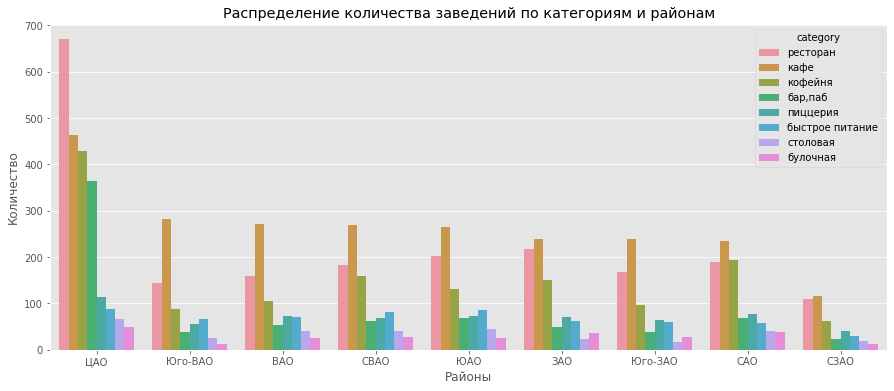

In [23]:
data_district = (
    t
    .groupby(['district','category'])
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)
display(data_district)
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='district', y='count', hue='category', data=data_district) 
ax.set_title('Распределение количества заведений по категориям и районам')
ax.set_xlabel('Районы')
ax.set_ylabel('Количество')

Как и следовало ожидать больше всего заведений в Центральном административном округе г. Москвы. Причем если в остальных округах преобладают заведения типа кафе в ЦАО основной тип заведений это рестораны. Это можно объяснить тем что рестораны более премиальный сегмент общепита а ЦАО более премиальный район, где обычно проживают люди с более высоким достатком..





Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

'Средний рейтинг: 4.2'

'Максимальный рейтинг: 5.0'

'Минимальный рейтинг: 1.0'

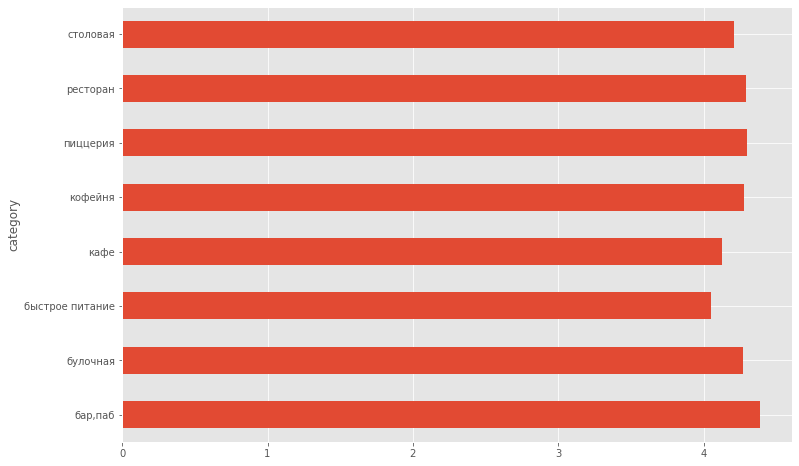

In [24]:
display(f'Средний рейтинг: {round(df.rating.mean(),1)}')
print()
display(f'Максимальный рейтинг: {round(df.rating.max(),1)}')
print()
display(f'Минимальный рейтинг: {round(df.rating.min(),1)}')
print()
df.groupby('category')['rating'].agg('mean').plot(kind = 'barh');

Средние рейтинги в зависимости от категории отличаются не сильно, средний рейтинг: 4.2, Максимальный рейтинг как и ожидалось 5.0, Минимальный: 1.0, видимо меньше единицы поставить нельзя..

https://drive.google.com/file/d/10r_Sy9uTTM5DDcClVUPmmOGCMU7VGK_B/view?usp=share_link

In [25]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.2
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


In [26]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('median')

# подключаем модуль для работы с JSON-форматом
import json


# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))


{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [27]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

In [28]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

Получили интерактивную карту со всеми заведениями из нашего датасета. 
Если увеличить масштаб мы увидим, что кластеры автоматически перегруппировываются: при достаточном приближении из кластеров начнут «выпадать» отдельные маркеры с заведениями. 

Найдите топ-15 улиц по количеству заведений

,street,category,name
0,проспект Мира,"[ресторан, кафе, быстрое питание, пиццерия, бу...",184
1,Профсоюзная улица,"[бар,паб, ресторан, булочная, пиццерия, кофейн...",122
2,проспект Вернадского,"[пиццерия, бар,паб, столовая, быстрое питание,...",108
3,Ленинский проспект,"[ресторан, столовая, кофейня, пиццерия, бар,па...",107
4,Ленинградский проспект,"[бар,паб, кафе, кофейня, ресторан, пиццерия, б...",95
5,Дмитровское шоссе,"[ресторан, пиццерия, столовая, кафе, кофейня, ...",88
6,Каширское шоссе,"[кофейня, ресторан, столовая, кафе, быстрое пи...",77
7,Варшавское шоссе,"[ресторан, быстрое питание, кофейня, кафе, сто...",76
8,Ленинградское шоссе,"[ресторан, бар,паб, кафе, столовая, булочная, ...",70
9,МКАД,"[кафе, ресторан, бар,паб, быстрое питание, коф...",65


Text(0, 0.5, 'Количество')

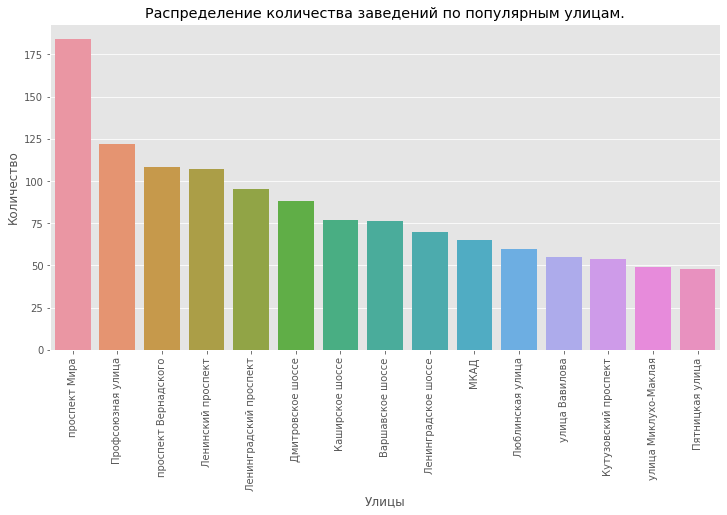

In [29]:
t2 = (df.pivot_table(
    index="street",
    values=[ "name", "category"],
    aggfunc={"category":'unique',"name":'count'})
    .sort_values('name', ascending=False).reset_index().head(15)
)

display(t2)
print()
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='street', y='name', data=t2) 
ax.set_title('Распределение количества заведений по популярным улицам.')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 90)
ax.set_xlabel('Улицы')
ax.set_ylabel('Количество')

Самая популярная улица по количиству заведений - Проспект Мира

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [30]:
only_one = (df.pivot_table(
    index=[ "street", "category"],
    values=[ "name"],
    aggfunc={"name":'count'})
    .sort_values('name', ascending=False).reset_index()
    .query('name == 1')
)
only_one

,street,category,name
1569,Шоссейный проезд,"бар,паб",1
1570,Яузский бульвар,"бар,паб",1
1571,Яузская улица,кафе,1
1572,Ташкентская улица,пиццерия,1
1573,Ясногорская улица,ресторан,1
...,...,...,...
3817,Моховая улица,"бар,паб",1
3818,Мукомольный проезд,булочная,1
3819,Мукомольный проезд,быстрое питание,1
3820,Мукомольный проезд,пиццерия,1


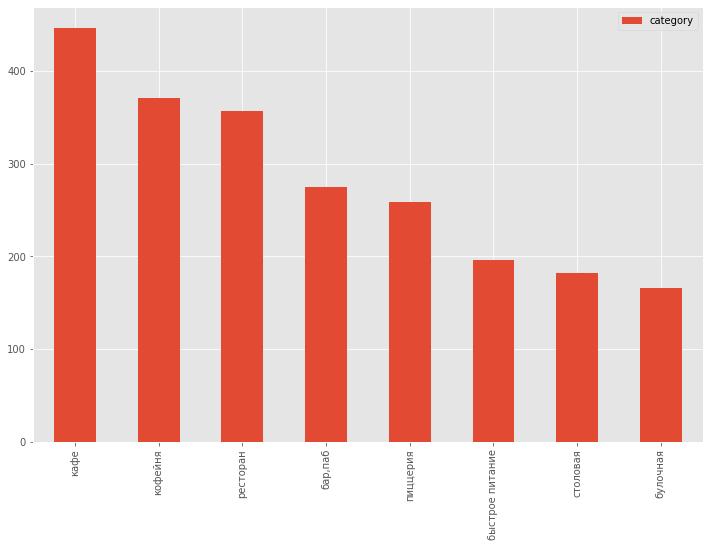

In [31]:
only_one['category'].value_counts().to_frame().plot(kind = 'bar');

На улицах с одним заведением количественно преобладают кафе - 447 шт, так же много кофеен - 371 и ресторанов - 357

In [32]:
district_avg_bill = df.groupby('district')['middle_avg_bill'].agg('median')
district_avg_bill

district
Восточный административный округ            575.0
Западный административный округ            1000.0
Северный административный округ             650.0
Северо-Восточный административный округ     500.0
Северо-Западный административный округ      700.0
Центральный административный округ         1000.0
Юго-Восточный административный округ        450.0
Юго-Западный административный округ         600.0
Южный административный округ                500.0
Name: middle_avg_bill, dtype: float64

Посчитаем медиану среднего чека для каждого района и
построим фоновую картограмму (хороплет) с полученными значениями для каждого района: 
Проанализируем цены в центральном административном округе и других.

In [33]:
district_avg_bill = (df.pivot_table(
    index='district',
    values="middle_avg_bill",
    aggfunc='median')
    .sort_values('middle_avg_bill', ascending=False).reset_index()
    
)
district_avg_bill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [34]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек по районам',
).add_to(m)

# выводим карту
m

Самые дорогие заведения расположены в Центральном и в Западном Адменистративном округе Москвы(медиана средний чек 1000 руб)

Минимальный медианный средний чек в Северо-Восточном административный округе, Южном административный округ	и в Юго-Восточный административный округ(медиана средного чека 450 - 500 руб)

Вывод: По итогу можно отметить среди всех заведений Москвы более всего преобладают кафе и рестораны, причем по их количеству сильно лидирует именно Центральный Административный округ, а если говорить в разрезе улиц то это Проспект Мира. Так же Центральный и в Западный Адменистративный округ лидируют по среднему чеку. Более всего преобладают не сетевые заведения, их на 61% больше чем сетевых. Самая популярная "вилка" по количеству посадочных мест это 40 - 80 мест 

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. 
Попробуем определить, осуществима ли мечта клиентов.

Для того чтобы понять в каком районе потенциально более перспективно открывать кофейню попробуем найти отношение количество кофеен к плотности населения на один квадратный км в этих районах. Возьмем именно плотность т.к все районы имеют разные разные размеры и разное количество жителей и брать какой либо один из этих показателей было бы неверно.

Согласно официальной информации на 2021 г. плотность населения по районам была распределена следующим образом:

- Центральный	11669,85	
- Северный 	10587,62	
- Северо-Восточный	14110,97	
- Восточный		9771,31	
- Юго-Восточный		12693,61	
- Южный		13579,2	
- Юго-Западный		12858,07	
- Западный		9391,05	
- Северо-Западный	11054,22	

Плотность населения представлена в чел/квадратный км.

In [35]:
cofee_places = df.query('category == "кофейня"') # сохраним в переменную срез по кофейням

In [36]:
# делаем сводную таблицу
cofee_count = (df.query('category == "кофейня"')
              .groupby('district')[['name','middle_coffee_cup','rating']]
              .agg({'name':'count','middle_coffee_cup':'median','rating':'mean'})
              .sort_values('name', ascending=False).reset_index()
)
cofee_count['population_density'] = [11669.85, 10587.62, 14110.97, 9391.05, 13579.2, 9771.31, 12858.07, 12693.61, 11054.22] # добавляем колонку с плотностью населения
cofee_count

,district,name,middle_coffee_cup,rating,population_density
0,Центральный административный округ,428,190.0,4.336449,11669.85
1,Северный административный округ,193,159.0,4.291710,10587.62
2,Северо-Восточный административный округ,159,162.5,4.216981,14110.97
3,Западный административный округ,150,189.0,4.195333,9391.05
4,Южный административный округ,131,150.0,4.232824,13579.20
5,Восточный административный округ,105,135.0,4.282857,9771.31
6,Юго-Западный административный округ,96,198.0,4.283333,12858.07
7,Юго-Восточный административный округ,89,147.5,4.225843,12693.61
8,Северо-Западный административный округ,62,165.0,4.325806,11054.22


Как и следовало ожидать больше всего кофеен в Центральном административный округе. Меньше всего в Северо-Западном административном округе. 

Найдем коэфициент показывающий отношение количества заведений к плотности населения в соответствующем районе:	

In [37]:
cofee_count['coefficient'] = cofee_count['population_density']/cofee_count['name']
t4 = cofee_count.sort_values('coefficient', ascending=False)
t4

,district,name,middle_coffee_cup,rating,population_density,coefficient
8,Северо-Западный административный округ,62,165.0,4.325806,11054.22,178.293871
7,Юго-Восточный административный округ,89,147.5,4.225843,12693.61,142.624831
6,Юго-Западный административный округ,96,198.0,4.283333,12858.07,133.938229
4,Южный административный округ,131,150.0,4.232824,13579.20,103.658015
5,Восточный административный округ,105,135.0,4.282857,9771.31,93.060095
2,Северо-Восточный административный округ,159,162.5,4.216981,14110.97,88.748239
3,Западный административный округ,150,189.0,4.195333,9391.05,62.607000
1,Северный административный округ,193,159.0,4.291710,10587.62,54.858135
0,Центральный административный округ,428,190.0,4.336449,11669.85,27.266005


Видим что лидирует Северо-Западный административный округ: на одну кофейню в среднем приходится плотность населения 178.293 Для сравнения в Центральном административном округе плотность населения 27.26 чел на одну кофейню.

При этом в СЗАО медианная стоимость чашки кофе составляет 165 руб. 

Посмотрим распределение коффеен по карте:

In [38]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cofee_places.apply(create_clusters, axis=1)

# выводим карту
m

Действительно плотность распределения кофеен не большая. Можно рекомендовать инвесторам рассмотреть именно Северо-Западный административный округ для открытия новой кофеейни, т.к в данном районе потенциально можно привлечь большее количество посетителей. 

Конечно это не является истиной в последней инстанции и гораздо сильнее на успех кофейни может влиять непосредственно расположение 'на местности'. Следует понимать что успех открытия кофейни  зависит от правильного расположения заведения не только в контексте района но и в контексте улицы и дома. Если вы «угадаете» с местом, то окупите вложения в 3-5 раз быстрее. 

При выборе места под кофейню, нужно обращать внимание на следующие критерии: видимость заведения с дороги – т.е. первая линия домов, наличие удобного подъезда или парковки, пешеходный трафик и т.д 

## Презентация

C презентаций можно ознакомиться перейдя по сл ссылке:

Презентация: https://drive.google.com/file/d/1DAJRmxkTAn64bEpJGXk-5HcveZMNeAor/view?usp=share_link



<div style="padding:0px 40px 30px; 
            color:#201E20;
            font-size:110%;
            display:fill;
            border-radius:20px;
            border: 5px double;
            border-color:#201E20;
            background-color: #F5EBEB;
            overflow:hidden;
            font-weight:450;"> 
<br>
<h1 style = "text-align:center;font-size:30px;">Общий вывод по проекту:</h1>  

    
Исследуя рынок заведений общественного питания Москвы мы выявили следующие  особенности:
- В общем количестве заведений больше всего кафе - 2378 шт(28%) и ресторанов 2043 шт(24%), меньше всего булочных, всего 256 шт(3%)
- Количественно всего заведений в Центральном административном округе г. Москвы. Причем если в остальных округах преобладают заведения типа кафе в ЦАО основной тип заведений это рестораны
- Самая популярная улица по количеству заведений это проспект Мира
- Самый популярный формат по посадочным местам это заведения с "вилкой" от 40 до 80 посадочных мест, и данное значение немного варируется в зависимости от категории. Максимально вместительное заведение достигает 1400 посадочных мест.
- Не сетевые заведения более распространены. Их на 61% больше чем сетевых. Причем сетевыми зачастую становятся кофейни и пицерии. Самые популярные сетевые заведения в Москве это Шоколадница, Домино'с пицца, Додо пицца
- Самые дорогие заведения расположены в Центральном и в Западном Адменистративном округе Москвы(медиана средний чек 1000 руб)
Минимальный медианный средний чек в Северо-Восточном административный округе, Южном административный округ и в Юго-Восточный административный округ(медиана средного чека 450 - 500 руб)

Так же нам удалось сформулировать рекомендации по открытию новой кофейни. На успешность подобного заведения влияет множество факторов, но нам удалось определить что на данный момент Северо-Западный административный округ имеет наибольшую плотность населения по отношению к количеству кофеен, и это при наличии привлекательного среднего чека за чашку кофе. Соответственно при соблюдении всех критериев успешности описанных нами выше, кофейня в этом округе имеет максимальный шанс на успех.


</div>